In [2]:
# from datetime import timedelta
import cv2
import numpy as np
import os
from tqdm import tqdm
import glob
import matplotlib.pyplot as plt
from PIL import Image
import shutil
from icecream import ic
import random
import json
import pickle

import torch
import torchvision.transforms as transforms

## some util
def print_img_stats(*imgs):
    for img in imgs:
        print(img.shape, img.min(), img.max())
        
def load_uint8_img(img_path):
    """load img as uint8"""
    img = plt.imread(img_path)
    if img.max() < 100: # float
        img = (np.clip(img, 0, 1) * 255).astype(np.uint8)
    else:
        img = np.clip(img, 0, 255).astype(np.uint8)
    return img


In [2]:
# import torchvision.io as io

# ok = io.read_image("/Users/jameschen/Desktop/16621 MSCV Capstone/Project/Code/data/IMG_2151/2252.jpg")

In [3]:
import torch
torch.__version__

'1.13.1'

In [4]:
import sys
print(sys.executable)

/Users/jameschen/opt/anaconda3/envs/capstone/bin/python


In [3]:
def plot_tensor_image_grid(img_list, n_per_row, titles=None, figsize=(15,10), 
                           untransform=None, transpose=False):
    """
    plt version of torchvision make_grid (via plt.subplots+untransform)
    + title 
    + figsize
    (can add plt.suptitle outside)

    args:
    img_list: list of img as tensor
    transpose: if True, go vertically down first
    """
    assert len(img_list) > 0
    if titles:
        assert len(img_list) == len(titles)
    n_row = (len(img_list)-1) // n_per_row + 1
    fig, axes = plt.subplots(n_row, n_per_row, figsize=figsize, 
                            squeeze=False, constrained_layout=True)
    for i, img in enumerate(img_list):
        if not transpose:
            if untransform:
                axes[i//n_per_row, i%n_per_row].imshow(untransform(img))
            else:
                axes[i//n_per_row, i%n_per_row].imshow(img)
            axes[i//n_per_row, i%n_per_row].axis("off")
            if titles:
                axes[i//n_per_row, i%n_per_row].set_title(titles[i])
        else:
            if untransform:
                axes[i%n_row, i//n_row].imshow(untransform(img))
            else:
                axes[i%n_row, i//n_row].imshow(img)
            axes[i%n_row, i//n_row].axis("off")
            if titles:
                axes[i%n_row, i//n_row].set_title(titles[i])
    for i in range(len(img_list), n_row*n_per_row):
        if not transpose:
            axes[i//n_per_row, i%n_per_row].axis("off")
        else:
            axes[i%n_row, i//n_row].axis("off")
#     return fig, axes

## Extract frames

### Check video info & frame

In [4]:
video_file = "data/raw_videos/dog_b_on_w.MOV"
cap = cv2.VideoCapture(video_file)
fps = cap.get(cv2.CAP_PROP_FPS)
fps

[ WARN:0@131.314] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_506zufg7xt/croots/recipe/opencv-suite_1664548331847/work/modules/videoio/src/cap_gstreamer.cpp (862) isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created
[ERROR:0@131.317] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_506zufg7xt/croots/recipe/opencv-suite_1664548331847/work/modules/videoio/src/cap.cpp (166) open VIDEOIO(GSTREAMER): raised OpenCV exception:

OpenCV(4.6.0) /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_506zufg7xt/croots/recipe/opencv-suite_1664548331847/work/modules/core/src/utils/filesystem.cpp:580: error: (-213:The function/feature is not implemented)  in function 'exists'




29.970932006835938

In [5]:
is_read, frame = cap.read()
ic(is_read, frame.shape)

ic| is_read: True, frame.shape: (720, 1280, 3)


(True, (720, 1280, 3))

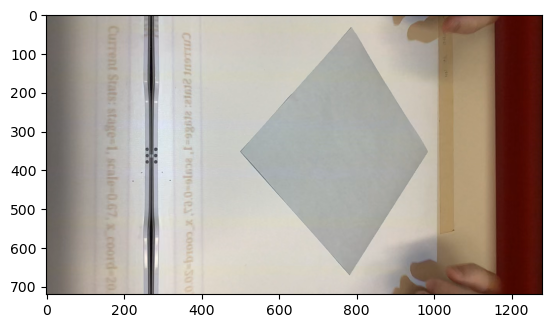

In [6]:
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
plt.imshow(frame)
plt.show()
# plt.imshow(center_crop_resize(frame))
# plt.show()

### Extract

In [8]:
# extract frames with fixed fps: 
# https://www.thepythoncode.com/article/extract-frames-from-videos-in-python
SAVING_FRAMES_PER_SECOND = 10

# transform = transforms.Compose([
#     transforms.ToTensor(),
#     transforms.CenterCrop(1080),
#     transforms.Resize((256,256), interpolation=transforms.InterpolationMode.BICUBIC),
# ])
# def center_crop_resize(frame):
#     square_frame = transform(frame)
#     square_frame = np.transpose(square_frame.numpy(), (1,2,0))
#     return square_frame

def get_saving_frames_durations(cap, saving_fps):
    """A function that returns the list of durations where to save the frames"""
    s = []
    # get the clip duration by dividing number of frames by the number of frames per second
    clip_duration = cap.get(cv2.CAP_PROP_FRAME_COUNT) / cap.get(cv2.CAP_PROP_FPS)
    # use np.arange() to make floating-point steps
    for i in np.arange(0, clip_duration, 1 / saving_fps):
        s.append(i)
    return s

def extract_frames(video_file, foldername, save_fps=SAVING_FRAMES_PER_SECOND):
    print("save to :",foldername)
    # make a folder by the name of the video file
    if not os.path.isdir(foldername):
        os.mkdir(foldername)
        
    # read the video file   
    assert os.path.isfile(video_file)
    cap = cv2.VideoCapture(video_file)
    print(f"#frames:{cap.get(cv2.CAP_PROP_FRAME_COUNT)}, FPS: {cap.get(cv2.CAP_PROP_FPS)}, "
          f"height:{cap.get(cv2.CAP_PROP_FRAME_HEIGHT)}, width:{cap.get(cv2.CAP_PROP_FRAME_WIDTH)}")
    
    # get the FPS of the video
    fps = cap.get(cv2.CAP_PROP_FPS)
    # if the SAVING_FRAMES_PER_SECOND is above video FPS, then set it to FPS (as maximum)
    saving_frames_per_second = min(fps, save_fps)
    # get the list of duration spots to save
    saving_frames_durations = get_saving_frames_durations(cap, saving_frames_per_second)
    print(f"Total saving frames: {len(saving_frames_durations)}")
    
    # start the loop
    frame_count = 0
    save_count = 0
    with tqdm(total=len(saving_frames_durations)) as pbar:
        while len(saving_frames_durations): # if the list is empty, all duration frames were saved
            is_read, frame = cap.read()
            if not is_read:
                break # break out of the loop if there are no frames to read

            # get the duration by dividing the frame count by the FPS
            frame_duration = frame_count / fps
            frame_count += 1 # increment the frame count
            closest_duration = saving_frames_durations[0] # get the earliest duration to save
            
            # if closest duration is less than/equals the frame duration, then save the frame
            if frame_duration >= closest_duration:
#                 frame = cv2.cvtColor(center_crop_resize(frame), cv2.COLOR_RGB2BGR)
#                 frame = (frame*255).astype(np.uint8)
#                 plt.imshow(frame)
#                 plt.show()
                
                cv2.imwrite(os.path.join(foldername, f"{save_count}.jpg"), frame) 
                saving_frames_durations.pop(0)
                save_count += 1
                pbar.update()

In [16]:
## local file
video_file = "data/raw_videos/dog_p_on_g.MOV"
foldername = "data/dog_p_on_g"

extract_frames(video_file, foldername)

save to : data/dog_p_on_g
#frames:16027.0, FPS: 29.97101402282715, height:720.0, width:1280.0
Total saving frames: 5348


[ WARN:0@746.392] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_506zufg7xt/croots/recipe/opencv-suite_1664548331847/work/modules/videoio/src/cap_gstreamer.cpp (862) isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created
[ERROR:0@746.393] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_506zufg7xt/croots/recipe/opencv-suite_1664548331847/work/modules/videoio/src/cap.cpp (166) open VIDEOIO(GSTREAMER): raised OpenCV exception:

OpenCV(4.6.0) /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_506zufg7xt/croots/recipe/opencv-suite_1664548331847/work/modules/core/src/utils/filesystem.cpp:580: error: (-213:The function/feature is not implemented)  in function 'exists'


100%|███████████████████████████████████████| 5348/5348 [03:09<00:00, 28.24it/s]


In [11]:
## local file
video_file = "data/raw_videos/dog_b_on_w_inst_dark.MOV"
foldername = "data/dog_b_on_w_inst_dark"

extract_frames(video_file, foldername)

[ WARN:0@1157.688] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_506zufg7xt/croots/recipe/opencv-suite_1664548331847/work/modules/videoio/src/cap_gstreamer.cpp (862) isPipelinePlaying OpenCV | GStreamer warning: GStreamer: pipeline have not been created
[ERROR:0@1157.688] global /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_506zufg7xt/croots/recipe/opencv-suite_1664548331847/work/modules/videoio/src/cap.cpp (166) open VIDEOIO(GSTREAMER): raised OpenCV exception:

OpenCV(4.6.0) /private/var/folders/sy/f16zz6x50xz3113nwtb9bvq00000gp/T/abs_506zufg7xt/croots/recipe/opencv-suite_1664548331847/work/modules/core/src/utils/filesystem.cpp:580: error: (-213:The function/feature is not implemented)  in function 'exists'




save to : data/dog_b_on_w_inst_dark
#frames:15090.0, FPS: 29.97100257873535, height:720.0, width:1280.0
Total saving frames: 5035


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5035/5035 [02:55<00:00, 28.64it/s]


### frame pruning:


In [20]:
## batch prune
def frame_pruning(in_folder, out_folder, start, end):
    """ prune all frames not in [start,end] in in_folder, so that start is 0 """
    assert os.path.exists(in_folder)
    if not os.path.exists(out_folder):
        os.mkdir(out_folder)
    
    for img_name in tqdm(range(start, end+1)):
        img_path = os.path.join(in_folder, f"{img_name}.jpg")
        img_output_path = os.path.join(out_folder, f"{img_name-start}.jpg")
        shutil.copy2(img_path, img_output_path)
    print(f"Save img from {in_folder} to {out_folder}")

In [23]:
# start = 171
# end = start + 3241
start = 7
end = start + 8857
in_folder = "data/3_phone"
out_folder = "data/3_phone_pruned"

frame_pruning(in_folder, out_folder, start, end)

AssertionError: 

In [24]:
os.path.exists("data/3_phone")

False

## Create label for dove

dove: (label 1~11 starts/ends when there is no hand occlusion)

    0: other (including barely touching, excluding hands under the paper)
    1: white paper
    2: blue triangle
    3: 2 w/ a smaller triangle folded over
    4: 3 w/ a white triangle folded back to the left
    5: 4 w/ the bottom half folded up
    6: 5 w/ one wing folded up (pointing leftwards)
    7: flip over
    8: 7 w/ the other wing folded up
    9: 8 horizontally flipped over + mouth folded down
    10: 9 + head insided inverse fold, finish
    -1: end (last frame + 1)
    
Maybe 6-8 is one step, 9-10 is one step?

### For training videos

In [380]:
foldername = "data/22_1_phone_pruned"

n_frames = len(glob.glob(foldername+"/*.jpg"))

# for IMG_2150.MOV.mov
label_interval = {0:1, 34:0, 247:2, 290:0, 482:3, 516:0, 654:4, 677:0, 977:5, 1006:0, 1210:6, 1232:0, 1269:7, 
                  1303:0, 1479:8, 1556:0, 1671:9, 1714:0, 1809:10, 1814:0, 1822:10, 1879:-1}
labels = []
label_interval = sorted(label_interval.items())
for i in range(len(label_interval) - 1):
    curr_time, curr_label = label_interval[i]
    next_time, _ = label_interval[i+1]
    labels += [curr_label] * (next_time - curr_time)
print("total labels: ", len(labels))
assert len(labels) == n_frames

labels = np.asarray(labels)
np.savetxt(os.path.join(foldername, "label.txt"), labels, fmt="%d")

total labels:  1879


In [ ]:
t = np.loadtxt(foldername+"/label.txt")
t.shape

(2106,)

### For testing frames

In [57]:
def frame_copy(in_folder, out_folder, frame_indices, labels=None):
    """ copy all frames in frame_indices, and save both frame_indices and labels in a .npz file """
    assert os.path.exists(in_folder)
    if not os.path.exists(out_folder):
        os.mkdir(out_folder)
    
    for img_name in tqdm(frame_indices):
        img_path = os.path.join(in_folder, f"{img_name}.jpg")
        img_output_path = os.path.join(out_folder, f"{img_name}.jpg")
        shutil.copy2(img_path, img_output_path)
    
    if labels is not None:
        np.savez(os.path.join(out_folder, "frame_label"), frame_indices=frame_indices, labels=labels)
    
    print(f"Save {len(frame_indices)} images from {in_folder} to {out_folder}")

In [150]:
foldername = "data/3_iPad"
foldername2 = "data/3_phone_pruned"

n_frames = len(glob.glob(foldername+"/*.jpg"))
label2frames = {
    ## 0001,0002,0003,0004,0005,0006,0007,0008,0009,0010|0011,0012,0013,0014,0015,0016,0017,0018,0019,0020|0021,0022,0023,0024,0025,0026,0027,0028,0029,0030
    1:[  20,  35,  58,  70,  90, 108, 125, 140, 155, 175, 190, 205, 220, 235, 250, 260, 275, 285, 300, 318, 335, 345, 360, 370, 385, 400, 413, 428, 438, 448, 465],
    2:[ 782, 807, 820, 835, 847, 860, 875, 885, 895, 910, 925, 935, 945, 958, 970, 983, 993,1020,1032,1045,1055,1070,1088,1109,1120,1135,1167,1180,1200,1215,1230],
    3:[1740,1755,1765,1777,1790,1798,1814,1826,1837,1854,1870,1883,1904,1917,1932,1944,1954,1969,1982,1994,2006,2019,2030,2041,2081,2089,2105,2118,2142,2197],
    4:[2469,2485,2501,2512,2525,2546,2556,2571,2584,2599,2616,2631,2644,2658,2675,2690,2704,2718,2732,2745,2759,2775,2787,2805,2818,2829,2849,2862,2875,2889,2906,2939],
    5:[3977,4099,4115,4129,4140,4154,4167,4186,4197,4209,4223,4237,4252,4267,4281,4292,4304,4317,4330,4342,4358,4369,4394,4419,4431,4444,4456,4472,4483,4497,4523],
    6:[5160,5172,5185,5200,5211,5224,5238,5252,5264,5285,5297,5314,5331,5347,5359,5373,5390,5411,5438,5449,5459,5471,5487,5500,5511,5525,5540,5575,5588,5600,5612],
    7:[5758,5778,5790,5803,5816,5830,5843,5856,5870,5883,5896,5910,5926,5943,5954,5970,5985,6001,6016,6036,6047,6074,6087,6100,6116,6128,6141,6157,6169,6187,6199,],
    8:[6556,6573,6594,6611,6623,6635,6652,6667,6678,6692,6705,6746,6763,6776,6791,6807,6822,6836,6852,6885,6899,6915,6927,6943,6961,6979,6995,7013,7051,7065,7080],
    9:[7366,7384,7402,7422,7437,7451,7473,7491,7508,7522,7536,7554,7574,7599,7616,7634,7650,7665,7684,7700,7715,7731,7745,7763,7783,7802,7824,7840,7863,7879,7899],
   10:[8103,8116,8135,8157,8175,8193,8209,8232,8255,8271,8293,8310,8322,8336,8357,8377,8398,8421,8438,8459,8482,8504,8525,8542,8563,8583,8602,8622,8646,8671,8691],
    
    0:[507, 570, 590, 720,1174,1420,1626,1702,2245,2339,2883,2979,3107,4450,4922,5106,5353,5712,5736,6248,6277,6319,6589,7206,7274,7314,7906,8003,8032,8805,8843]
}

current_label=0


ic| len(img_list): 31


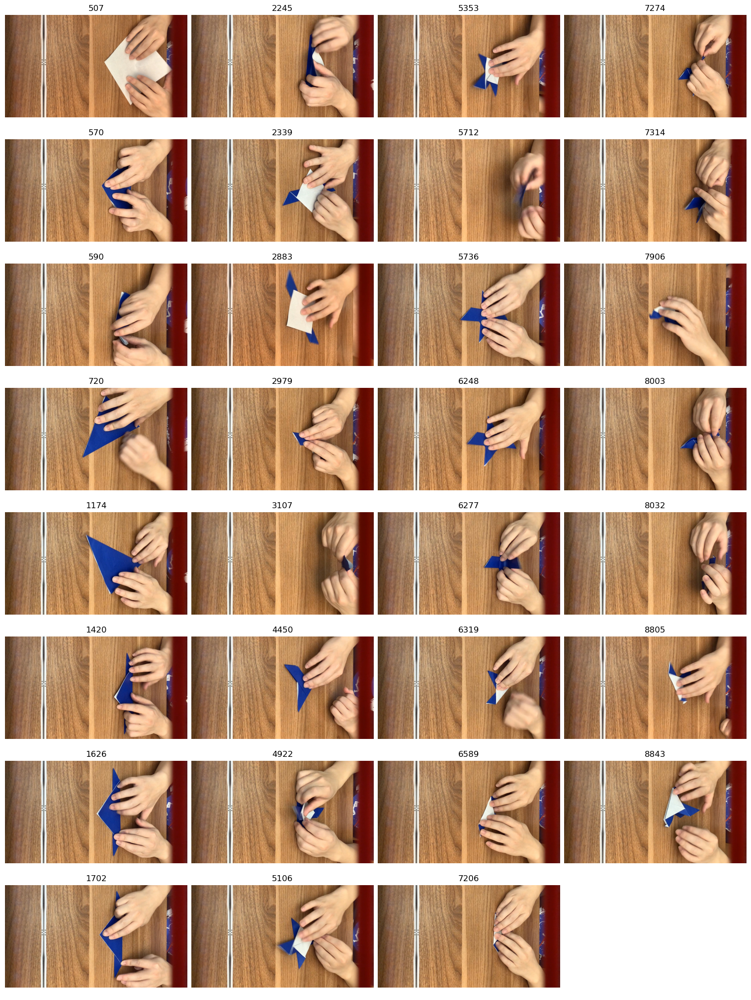

In [146]:
frame_index_list = label2frames[current_label]
img_list = [load_uint8_img(f"{foldername}/{frame_index}.jpg") for frame_index in frame_index_list]
ic(len(img_list))
plot_tensor_image_grid(img_list, 4, titles=frame_index_list, figsize=(15,20), transpose=True)

ic| len(img_list): 31


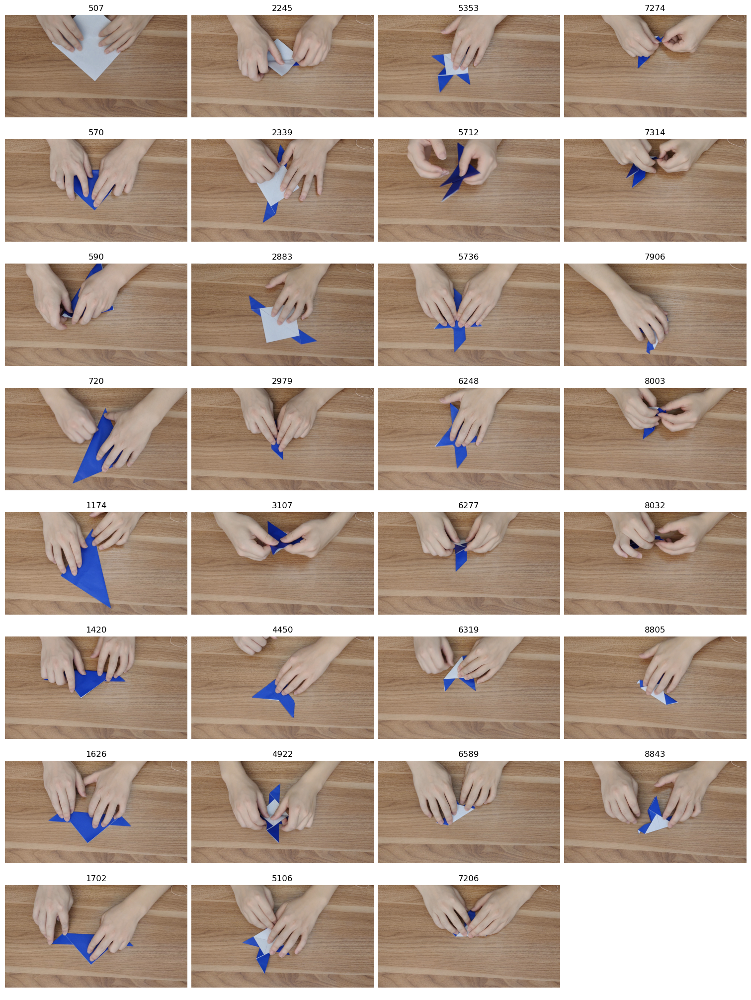

In [147]:
frame_index_list = label2frames[current_label]
img_list = [load_uint8_img(f"{foldername2}/{frame_index}.jpg") for frame_index in frame_index_list]
ic(len(img_list))
plot_tensor_image_grid(img_list, 4, titles=frame_index_list, figsize=(15,20), transpose=True)

In [173]:
frame_indices, labels = [],[]
N_LABEL = 11
n_frame_per_label = 30
suffix = "_anno"
for label in range(N_LABEL):
    current_frames = label2frames[label][:n_frame_per_label]
    assert len(current_frames) == n_frame_per_label
    
    frame_indices.extend(current_frames)
    labels.extend([label]*n_frame_per_label)
ic(len(frame_indices), len(labels))

labels = np.array(labels, dtype=int)
frame_indices = np.array(frame_indices, dtype=int)


frame_copy(foldername2, foldername2+suffix, frame_indices, labels)

ic| len(frame_indices): 330, len(labels): 330
100%|███████████████████████████████████████████████████| 330/330 [00:02<00:00, 137.72it/s]

Save 330 images from data/3_phone_pruned to data/3_phone_pruned_anno


In [168]:
label_dict = np.load(os.path.join(foldername2, "frame_label.npz"))
frame_indices, labels =  label_dict['frame_indices'], label_dict["labels"]
frame_indices, labels

(array([ 507,  570,  590,  720, 1174, 1420, 1626, 1702, 2245, 2339, 2883,
        2979, 3107, 4450, 4922, 5106, 5353, 5712, 5736, 6248, 6277, 6319,
        6589, 7206, 7274, 7314, 7906, 8003, 8032, 8805,   20,   35,   58,
          70,   90,  108,  125,  140,  155,  175,  190,  205,  220,  235,
         250,  260,  275,  285,  300,  318,  335,  345,  360,  370,  385,
         400,  413,  428,  438,  448,  782,  807,  820,  835,  847,  860,
         875,  885,  895,  910,  925,  935,  945,  958,  970,  983,  993,
        1020, 1032, 1045, 1055, 1070, 1088, 1109, 1120, 1135, 1167, 1180,
        1200, 1215, 1740, 1755, 1765, 1777, 1790, 1798, 1814, 1826, 1837,
        1854, 1870, 1883, 1904, 1917, 1932, 1944, 1954, 1969, 1982, 1994,
        2006, 2019, 2030, 2041, 2081, 2089, 2105, 2118, 2142, 2197, 2469,
        2485, 2501, 2512, 2525, 2546, 2556, 2571, 2584, 2599, 2616, 2631,
        2644, 2658, 2675, 2690, 2704, 2718, 2732, 2745, 2759, 2775, 2787,
        2805, 2818, 2829, 2849, 2862, 

### For Dog train video

In [12]:
foldername = "data/dog_p_on_g_homog"

n_frames = len(glob.glob(foldername+"/*.jpg"))
print(f"total of {n_frames} frames")
label2frames = {
    ## the last 2 columns are extra image for test
    ## 0001,0002,0003,0004,0005,0006,0007,0008,0009,0010|0011,0012,0013,0014,0015
    1:[   0,  30,  35,  69,  74, 100, 107, 110, 141, 150, 169, 171, 178, 216, 223, 231, 227,  72],
    2:[ 453, 480, 490, 575, 580, 618, 621, 652, 660, 694, 712, 722, 992,1086,1052, 981, 445],
    3:[1307,1311,1343,1361,1380,1382,1411,1415,1464,1467,1488,1491,1525,1527,1563,1530,1559],
    4:[2035,2038,2063,2068,2092,2098,2127,2134,2153,2160,2187,2190,2195,2242,2280,2236,2270],
    5:[2886,2894,2927,2932,2972,2975,3056,3081,3100,3105,3121,3140,3182,3197,3299,3123,3144],
    6:[3724,3729,3741,3747,3769,3785,3793,3805,3813,3816,3819,3834,3862,3881,3911,3843,3884],
    7:[4428,4434,4547,4550,4557,4569,4590,4611,4636,4639,4672,4713,4735,4740,4761,4770,4711],
    8:[5090,5095,5146,5168,5190,5197,5226,5268,5295,5300,5321,5327,5335,5347,5342,5148,5339],
}

# obtain all transition frames
label0_interval = [
    (234,432), (456, 478), (1104, 1269), (1580,1903), (1909, 1917), (1922,1978), (1997,2017),
    (2340,2882), (3200,3293), (3301,3456), (3481,3700), (3703,3723), (3981,4047), (4359,4424),
    (4772,5085)
]

total of 5348 frames


ic| len(img_list): 8


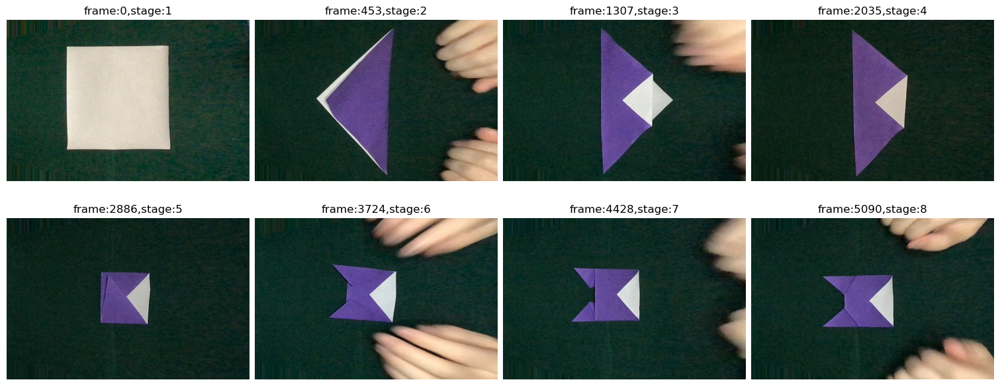

In [62]:
# visualize
img_list = []
frame_index_list = []
for i in range(1,9):
    frame_index = label2frames[i][0]
    img = load_uint8_img(f"{foldername}/{frame_index}.jpg") 
    img_list.append(img)
    frame_index_list.append(f"frame:{frame_index},stage:{i}")
ic(len(img_list))
plot_tensor_image_grid(img_list, 4, titles=frame_index_list, figsize=(15,6), transpose=False) 

In [13]:
# convert annotation into a list of index and a list of labels
index_0 = []
for start_time,end_time in sorted(label0_interval):
    index_0 += list(range(start_time, end_time +1))
label2frames[0] = index_0
print("total transition labels_0: ", len(index_0))

indices = []
labels = []
for curr_label in list(range(1, len(label2frames))) + [0]:
    curr_indices = label2frames[curr_label]
    indices.extend(curr_indices)
    labels += [curr_label] * len(curr_indices)
print("total ind:", len(indices), "total labels: ", len(labels))

labels = np.asarray(labels)
indices = np.asarray(indices)
assert len(labels) == len(indices)

total transition labels_0:  2280
total ind: 2417 total labels:  2417


#### Save all indices

In [64]:
## Save
in_folder = "data/dog_p_on_g"
out_folder = "data/dog_p_on_g_anno"
# np.savetxt(os.path.join(foldername, "label.txt"), labels, fmt="%d")
frame_copy(in_folder, out_folder, indices, labels=None)

np.savez(os.path.join(out_folder, "frame_label"), frame_indices=indices, labels=labels)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2417/2417 [02:04<00:00, 19.47it/s]

Save 2417 images from data/dog_p_on_g to data/dog_p_on_g_anno


In [59]:
# check 
label = np.load("data/dog_p_on_g_anno_homog/frame_label.npz")
list(label.keys())

['frame_indices', 'labels']

In [60]:
len(label['frame_indices']), label['frame_indices'], label["labels"], np.unique(label["labels"])

(2417,
 array([   0,   30,   35, ..., 5083, 5084, 5085]),
 array([1, 1, 1, ..., 0, 0, 0]),
 array([0, 1, 2, 3, 4, 5, 6, 7, 8]))

#### Separate train, val, test 

In [14]:
## Save train, val, test separately
## due to the way I annotate, the first column and the last 2 columns are pretty redundant 
num_val = 1
num_train = 14 # can be more
num_test = 2

total = num_val + num_train + num_test
random.shuffle(index_0)
total0 = len(index_0)
num_val0 = int(num_val/total * total0)
num_val_train = int( (num_val+num_train)/total * total0)

# train index
indices_train = []
labels_train = []
for curr_label in list(range(1, len(label2frames))):
    curr_indices = label2frames[curr_label][num_val:-num_test]
    indices_train.extend(curr_indices)
    labels_train += [curr_label] * len(curr_indices)
indices_train.extend(index_0[num_val0:num_val_train]) # add 0
labels_train.extend([0]*(num_val_train - num_val0))

labels_train = np.asarray(labels_train)
indices_train = np.asarray(indices_train)
print("Train: total ind:", len(indices_train), "total labels: ", len(labels_train))
assert len(labels_train) == len(indices_train)

# val index
indices_val = []
labels_val = []
for curr_label in list(range(1, len(label2frames))):
    curr_indices = label2frames[curr_label][:num_val]
    indices_val.extend(curr_indices)
    labels_val += [curr_label] * len(curr_indices)
indices_val.extend(index_0[:num_val0]) # add 0
labels_val.extend([0]*(num_val0))

labels_val = np.asarray(labels_val)
indices_val = np.asarray(indices_val)
print("Val: total ind:", len(indices_val), "total labels: ", len(labels_val))
assert len(labels_val) == len(indices_val)

# test index
indices_test = []
labels_test = []
for curr_label in list(range(1, len(label2frames))):
    curr_indices = label2frames[curr_label][-num_test:]
    indices_test.extend(curr_indices)
    labels_test += [curr_label] * len(curr_indices)
indices_test.extend(index_0[num_val_train:]) # add 0
labels_test.extend([0]*(total0 - num_val_train))

labels_test = np.asarray(labels_test)
indices_test = np.asarray(indices_test)
print("Test: total ind:", len(indices_test), "total labels: ", len(labels_test))
assert len(labels_test) == len(indices_test)

assert len(labels_test) + len(labels_val) + len(labels_train) == len(labels)
for i in [len(labels_test), len(labels_val), len(labels_train)]:
    print(i/len(labels))

Train: total ind: 1990 total labels:  1990
Val: total ind: 142 total labels:  142
Test: total ind: 285 total labels:  285
0.11791477037649979
0.05875051717004551
0.8233347124534547


In [65]:
# ## Save
# # in_folder = "data/dog_p_on_g_homog"
# out_folder = "data/dog_p_on_g_anno_homog"
# np.savez(os.path.join(out_folder, "frame_label_train"), frame_indices=indices_train, labels=labels_train)
# np.savez(os.path.join(out_folder, "frame_label_val"), frame_indices=indices_val, labels=labels_val)
# np.savez(os.path.join(out_folder, "frame_label_test"), frame_indices=indices_test, labels=labels_test)

In [25]:
indices_train, labels_train, indices_val, labels_val, indices_test, labels_test

(array([  35,   69,   74, ..., 2008, 1829, 5053]),
 array([1, 1, 1, ..., 0, 0, 0]),
 array([  30,  453, 1307, 2035, 2886, 3724, 4428, 5090, 2342, 3554, 3711,
        2573, 2530, 2602, 4783, 1838, 2417,  413,  348, 3369, 4940, 3553,
        2857, 5028, 1887, 3648, 3348, 4801, 4849, 2806, 4368, 1740, 3992,
        4811, 4998,  271, 4040,  290, 1937, 2776, 2400, 2350, 4359, 1893,
        4965, 5055, 4846, 2482, 3519,  425,  308,  297,  405, 2837, 2691,
        1940, 2581, 4013, 2771, 1151, 1185, 2366, 3528, 3324, 2013, 2688,
        4931, 2875, 2606, 1144, 1660, 1821, 5043, 4403, 3574, 2793, 5035,
        3691, 3321, 3489, 1251, 2852, 2016, 2865, 3498, 3602, 2469, 3201,
        3541, 4993, 1174, 2686, 1693, 2629, 2836, 3353,  385, 2684, 3623,
        3695, 2451, 2657, 3259, 1216,  390, 4399, 1883, 4014, 3306, 5014,
        3655, 2002, 1963, 4932, 4808, 1238, 4946, 2489, 3532,  303, 3723,
        3696, 2362, 2750, 4015, 1265, 2526, 2728, 1598, 3996, 1721, 2811,
        2868, 2484, 1225, 25

In [71]:
anno_train = np.load("data/dog_p_on_g_anno_homog/frame_label_val.npz")
indices_train, labels_train = anno_train["frame_indices"], anno_train["labels"]
indices_train, labels_train

(array([   0,  453, 1307, 2035, 2886, 3724, 4428, 5090, 2561, 1632, 3530,
        2813, 3560, 2764, 3403, 4037,  285, 2736, 4928, 5004, 2408, 3720,
        2482, 1124,  321, 4967, 2661, 1242, 2533, 4810, 3248, 2469, 4038,
        3482,  426, 3334, 3283, 2801, 3390, 1630, 4397,  359, 2795, 2830,
        5076, 5070, 1821, 2499, 3662, 1110, 2005, 2734, 1716, 2708, 4400,
        2551, 3375, 2517, 1707, 5058,  280, 2435, 4877, 2545, 4368,  472,
        4878, 1136, 2399, 5015,  411, 3214, 3223, 5055, 2382, 1922, 4033,
        1142, 3526,  332, 5011, 1244, 3408, 3501, 4891, 2448, 3639, 4844,
        1650, 3346, 2440, 3203, 1604, 4790, 2646, 3659, 1733, 2007, 2484,
        2596, 2718, 4802, 4787, 2472, 2792, 3667, 2645, 3293, 4385, 1193,
        1655, 4911, 1948, 4369, 1188, 2710, 1952, 1172, 3255, 4867, 1634,
        1697, 4916, 2660, 1698, 3515, 4816, 2597,  242, 2664, 4809, 3531,
        1773, 2650, 1234, 4817, 1731,  362, 1814,  247, 3311, 3262]),
 array([1, 2, 3, 4, 5, 6, 7, 8, 0, 0, 0, 0

#### Filter data w/o bbox from GroundingDINO

In [111]:
with open("data/dog_p_on_g_anno_homog/annotation.json", "r") as fin:
    annotations = json.load(fin)
len(annotations), annotations[0]

(2417,
 {'image_id': 5095,
  'bboxes': [[350.4292907714844,
    280.67083740234375,
    356.6502990722656,
    264.15679931640625]],
  'pred_phrases': [0.91]})

In [112]:
anno_dict = {}
bad_anno_dict = {}
for anno in annotations:
    image_id = anno["image_id"]
    bboxes = anno["bboxes"]
    pred_phrases = anno["pred_phrases"]
    assert len(bboxes) == len(pred_phrases)
    if len(bboxes) != 1:
#         ic(image_id, labels[indices.tolist().index(image_id)], len(bboxes))
        if len(bboxes) not in bad_anno_dict:
            bad_anno_dict[len(bboxes)] = []
        bad_anno_dict[len(bboxes)].append(image_id)
    anno_dict[image_id] = (bboxes, pred_phrases)
len(anno_dict), len(bad_anno_dict)

(2417, 1)

In [120]:
bad_anno_dict[0]

[5019, 4991]

In [123]:
## Filter train, val, test separately

# train index
new_indices_train = [ind for i,ind in enumerate(indices_train) if indices_train[i] not in bad_anno_dict[0]]
new_labels_train = [label for i,label in enumerate(labels_train) if indices_train[i] not in bad_anno_dict[0]]
new_indices_train = np.asarray(new_indices_train)
new_labels_train = np.asarray(new_labels_train)
print("Train: total ind:", len(new_indices_train), "total labels: ", len(new_labels_train))
assert len(new_labels_train) == len(new_indices_train)

# val index
new_indices_val = [ind for i,ind in enumerate(indices_val) if indices_val[i] not in bad_anno_dict[0]]
new_labels_val = [label for i,label in enumerate(labels_val) if indices_val[i] not in bad_anno_dict[0]]
new_indices_val = np.asarray(new_indices_val)
new_labels_val = np.asarray(new_labels_val)
print("Train: total ind:", len(new_indices_val), "total labels: ", len(new_labels_val))
assert len(new_labels_val) == len(new_indices_val)

# test index
new_indices_test = [ind for i,ind in enumerate(indices_test) if indices_test[i] not in bad_anno_dict[0]]
new_labels_test = [label for i,label in enumerate(labels_test) if indices_test[i] not in bad_anno_dict[0]]
new_indices_test = np.asarray(new_indices_test)
new_labels_test = np.asarray(new_labels_test)
print("Train: total ind:", len(new_indices_test), "total labels: ", len(new_labels_test))
assert len(new_labels_test) == len(new_indices_test)

new_total = len(labels) - len(bad_anno_dict[0])
for i in [len(new_labels_test), len(new_labels_val), len(new_labels_train)]:
    print(i/new_total)

Train: total ind: 1988 total labels:  1988
Train: total ind: 142 total labels:  142
Train: total ind: 285 total labels:  285
0.11801242236024845
0.05879917184265011
0.8231884057971014


In [124]:
# ## Save
# # in_folder = "data/dog_p_on_g_homog"
# out_folder = "data/dog_p_on_g_anno_homog"
# np.savez(os.path.join(out_folder, "frame_label_train"), frame_indices=new_indices_train, labels=new_labels_train)
# np.savez(os.path.join(out_folder, "frame_label_val"), frame_indices=new_indices_val, labels=new_labels_val)
# np.savez(os.path.join(out_folder, "frame_label_test"), frame_indices=new_indices_test, labels=new_labels_test)

ic| len(img_list): 8


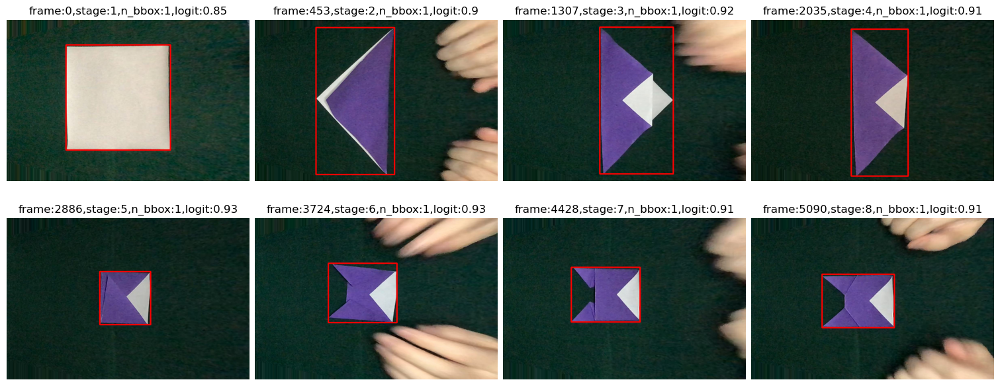

In [118]:
# visualize each stage
foldername = "data/dog_p_on_g_anno_homog"
img_list = []
title_list = []
for i in range(1,9):
    frame_index = label2frames[i][0]
    img = load_uint8_img(f"{foldername}/{frame_index}.jpg") 
    bboxes, pred_phrases = anno_dict[frame_index]
    for bbox in bboxes:
        x1,y1, w,h = bbox
        x1,y1, w,h = int(x1), int(y1), int(w), int(h)
        x2,y2 = x1+w, y1+h
        cv2.rectangle(img, (x1,y1), (x2,y2), color=(255,0,0), thickness=5)
    img_list.append(img)
    title_list.append(f"frame:{frame_index},stage:{i},n_bbox:{len(bboxes)},logit:{pred_phrases[0]}")
ic(len(img_list))
plot_tensor_image_grid(img_list, 4, titles=title_list, figsize=(15,6), transpose=False) 

In [114]:
for key in bad_anno_dict:
    print("len:",key, "frequency:",len(bad_anno_dict[key]))

len: 0 frequency: 2


ic| len(img_list): 8


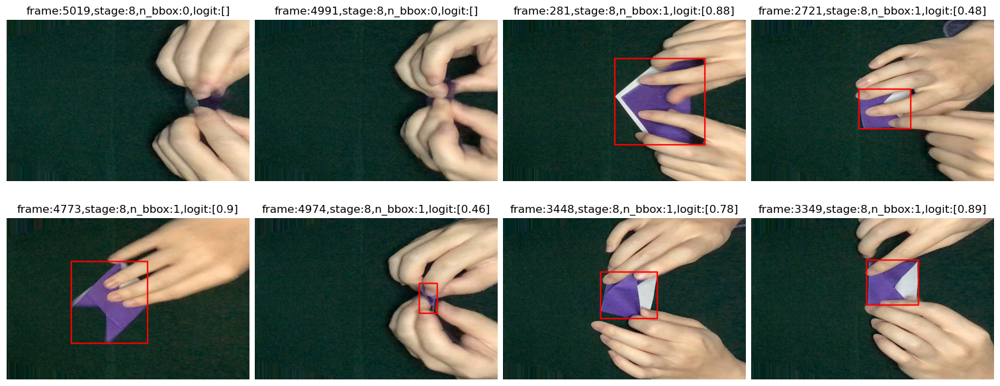

In [117]:
# visualize frame s.t. len(bboxes) != 1, (all in stage 0)
foldername = "data/dog_p_on_g_anno_homog"
img_list = []
title_list = []
for frame_index in bad_anno_dict[0] + random.sample(label2frames[0], 6):
    img = load_uint8_img(f"{foldername}/{frame_index}.jpg") 
    bboxes, pred_phrases = anno_dict[frame_index]
    for bbox in bboxes:
        x1,y1, w,h = bbox
        x1,y1, w,h = int(x1), int(y1), int(w), int(h)
        x2,y2 = x1+w, y1+h
        cv2.rectangle(img, (x1,y1), (x2,y2), color=(255,0,0), thickness=5)
    img_list.append(img)
    title_list.append(f"frame:{frame_index},stage:{i},n_bbox:{len(bboxes)},logit:{pred_phrases[0]}")
ic(len(img_list))
plot_tensor_image_grid(img_list, 4, titles=title_list, figsize=(15,6), transpose=False) 

ic| len(img_list): 12


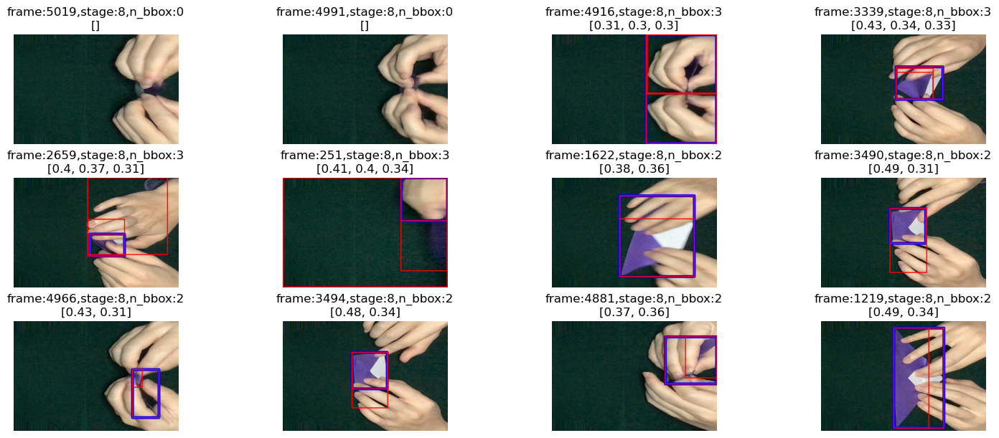

In [96]:
# ## added this to groundingDINO script
# ## visualize frame s.t. len(bboxes) != 1
# foldername = "data/dog_p_on_g_anno_homog"
# img_list = []
# title_list = []
# for frame_index in bad_anno_dict[0] + bad_anno_dict[3] + bad_anno_dict[2][:6]:
#     img = load_uint8_img(f"{foldername}/{frame_index}.jpg") 
#     bboxes, pred_phrases = anno_dict[frame_index]
#     if len(bboxes) > 0:
#         pred_phrases = [float(phrase.split("(")[-1].split(")")[0]) for phrase in pred_phrases]
#         ind = np.argmax(pred_phrases)
#         x1,y1, w,h = bboxes[ind]
#         x1,y1, w,h = int(x1), int(y1), int(w), int(h)
#         x2,y2 = x1+w, y1+h
#         cv2.rectangle(img, (x1,y1), (x2,y2), color=(0,0,255), thickness=20)
        
#         for bbox in bboxes:
#             x1,y1, w,h = bbox
#             x1,y1, w,h = int(x1), int(y1), int(w), int(h)
#             x2,y2 = x1+w, y1+h
#             cv2.rectangle(img, (x1,y1), (x2,y2), color=(255,0,0), thickness=5)
#     img_list.append(img)
    
#     title_list.append(f"frame:{frame_index},stage:{label},n_bbox:{len(bboxes)}\n{pred_phrases}")
# ic(len(img_list))
# plot_tensor_image_grid(img_list, 4, titles=title_list, figsize=(15,6), transpose=False) 

#### Reselect train image for one-shot detection

In [15]:
data_folder = "data/dog_p_on_g_anno_homog"
train_anno = np.load(os.path.join(data_folder, "frame_label_train.npz"))
eval_anno = np.load(os.path.join(data_folder, "frame_label_val.npz"))
test_anno = np.load(os.path.join(data_folder, "frame_label_test.npz"))
train_indices, train_labels = train_anno["frame_indices"],train_anno["labels"]
test_indices, test_labels = test_anno["frame_indices"],test_anno["labels"]
len(train_indices), len(train_labels), len(test_indices), len(test_labels)

(1988, 1988, 285, 285)

In [16]:
# list to dict
train_anno_dict = {i:[] for i in range(9)}
for train_ind, train_label in zip(train_indices, train_labels):
    train_anno_dict[train_label].append(train_ind)
    
test_anno_dict = {i:[] for i in range(9)}
for test_ind, test_label in zip(test_indices, test_labels):
    test_anno_dict[test_label].append(test_ind)
# test_anno_dict

In [17]:
## load anno
with open("data/dog_p_on_g_anno_homog/annotation.json", "r") as fin:
    annotations = json.load(fin)
print(len(annotations), annotations[0])

ind2bbox = {}
for anno in annotations:
    image_id = anno["image_id"]
    bboxes = anno["bboxes"]
#     pred_phrases = anno["pred_phrases"]
    if len(bboxes) != 1:
        ic(image_id, len(bboxes))
        continue
    ind2bbox[image_id] = bboxes
len(ind2bbox)

2417 {'image_id': 5095, 'bboxes': [[350.4292907714844, 280.67083740234375, 356.6502990722656, 264.15679931640625]], 'pred_phrases': [0.91]}


ic| image_id: 5019, len(bboxes): 0
ic| image_id: 4991, len(bboxes): 0


2415

In [22]:
new_train_anno_dict = {i:[] for i in range(9)}
## 8 angles (too many)
# new_train_anno_dict[1] = [30,69,100,141,169,223]
# new_train_anno_dict[2] = [480,575,618,652, 694,712,992,1052]
# new_train_anno_dict[3] = [1311,1343,1380,1411,1464,1488,1525,1563]
# new_train_anno_dict[4] = [2038,2063,2092,2127,2153,2187,2242,2280]
# new_train_anno_dict[5] = [2894,2927,2972,3056,3081,3100,3140,3182]
# new_train_anno_dict[6] = [3729,3769,3785,3805,3834,3862,3881,3911]
# new_train_anno_dict[7] = [4434,4590,4611,4636,4672,4713,4735,4761]
# new_train_anno_dict[8] = [5095,5146,5168,5190,5226,5268,5295,5321]
# new_train_anno_dict[0] = np.random.choice(train_anno_dict[0], size=15, replace=False).tolist()
# while np.var(new_train_anno_dict[0]) < 2300000:
#     new_train_anno_dict[0] = np.random.choice(train_anno_dict[0], size=15, replace=False).tolist()
# print(np.var(new_train_anno_dict[0]))

## 4 angles
new_train_anno_dict[1] = [30,69,141,169]
new_train_anno_dict[2] = [480,618, 694,992]
new_train_anno_dict[3] = [1311,1380,1464,1525]
new_train_anno_dict[4] = [2038,2092,2153,2242]
new_train_anno_dict[5] = [2894,2972,3081,3140]
new_train_anno_dict[6] = [3729,3785,3834,3881]
new_train_anno_dict[7] = [4434,4611,4672,4735]
new_train_anno_dict[8] = [5095,5168,5226,5295]
new_train_anno_dict[0] = [3287,401, 1223,3987,429,2664,4891,5055]

In [43]:
## find a good var threshold
# for _ in range(10):
#     tmp = np.random.choice(train_anno_dict[0], size=15, replace=False).tolist()
#     print(np.var(tmp), sorted(tmp))

ic| len(img_list): 15


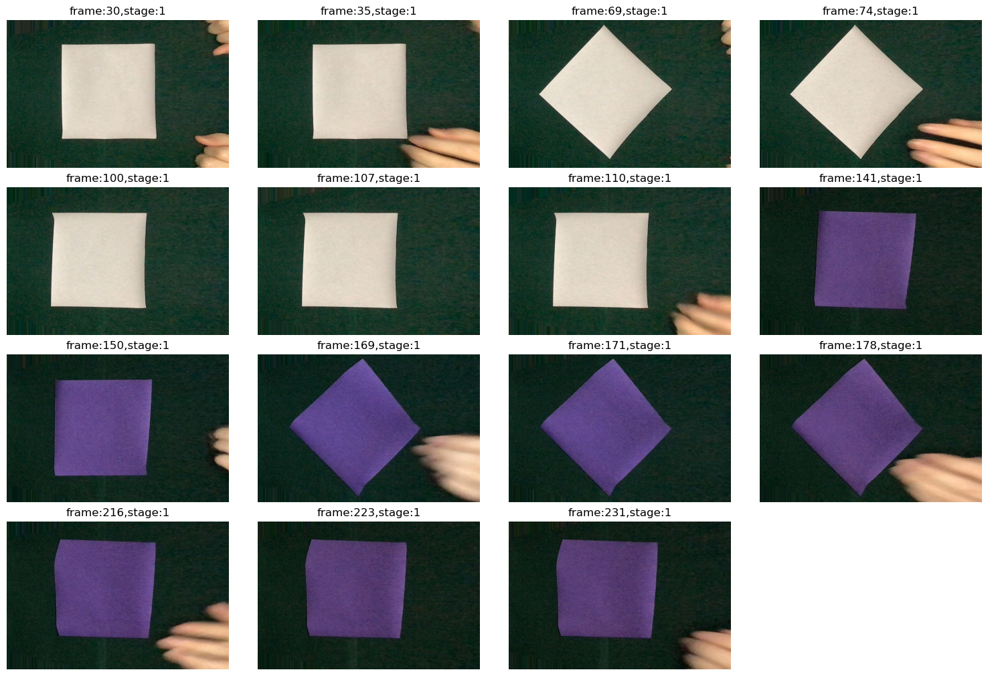

In [12]:
# visualize frame for each label to select
foldername = "data/dog_p_on_g_anno_homog"
label = 1
img_list = []
title_list = []
for frame_index in train_anno_dict[label]:
    img = load_uint8_img(f"{foldername}/{frame_index}.jpg") 
    img_list.append(img)
    title_list.append(f"frame:{frame_index},stage:{label}")
ic(len(img_list))
plot_tensor_image_grid(img_list, 4, titles=title_list, figsize=(15,10), transpose=False) 

ic| len(img_list): 15


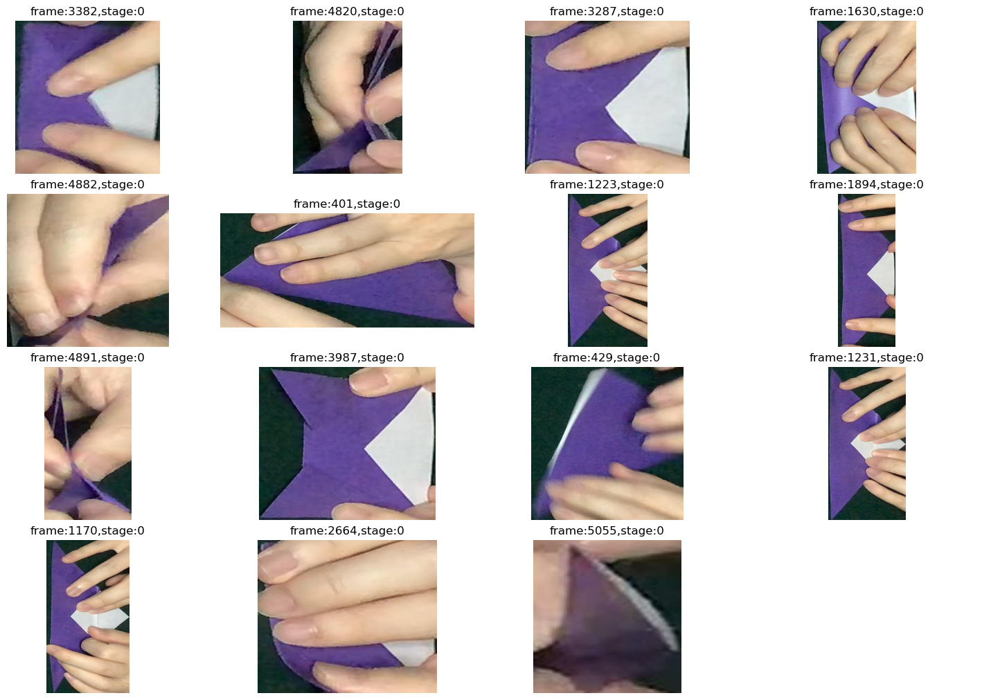

In [21]:
# check bbox for each label to select
foldername = "data/dog_p_on_g_anno_homog"
label = 0
img_list = []
title_list = []
for frame_index in new_train_anno_dict[label]:
    img = load_uint8_img(f"{foldername}/{frame_index}.jpg") 
    bbox = ind2bbox[frame_index]
    if len(bbox) == 0:
        print("Skip", frame_index)
        continue
    x1,y1, w,h = bbox[0]
    x1,y1, w,h = int(x1), int(y1), int(w), int(h)
    x2,y2 = x1+w, y1+h
    img_list.append(img[y1:y2+1, x1:x2+1])
    title_list.append(f"frame:{frame_index},stage:{label}")
ic(len(img_list))
plot_tensor_image_grid(img_list, 4, titles=title_list, figsize=(15,10), transpose=False) 

ic| len(img_list): 15


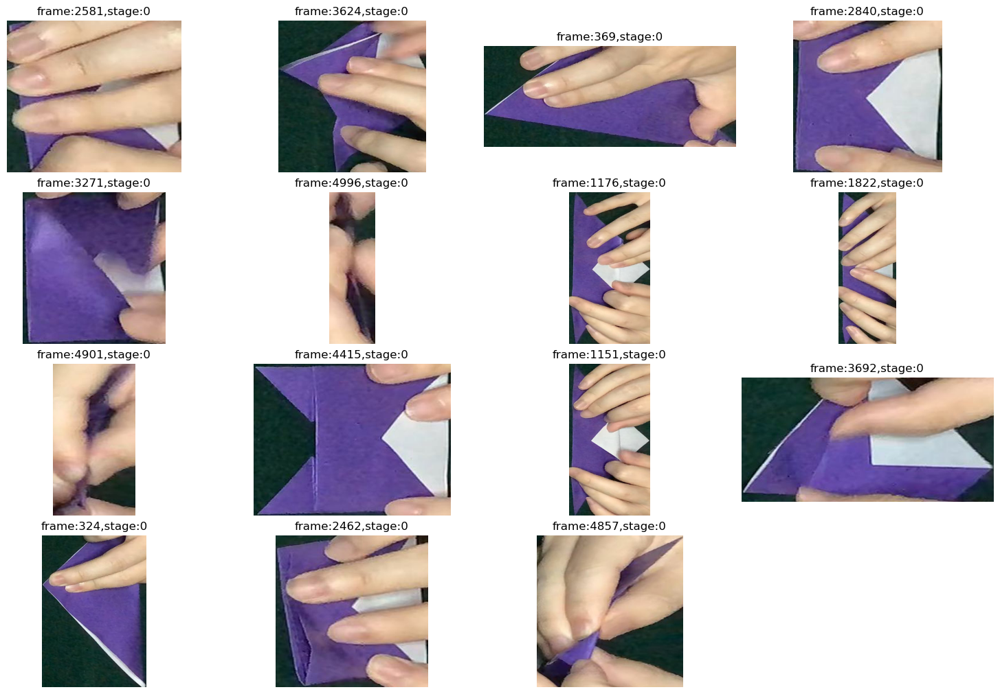

In [69]:
# check bbox for each label to select
foldername = "data/dog_p_on_g_anno_homog"
label = 0
img_list = []
title_list = []
for frame_index in new_train_anno_dict[label]:
    img = load_uint8_img(f"{foldername}/{frame_index}.jpg") 
    bbox = ind2bbox[frame_index]
    if len(bbox) == 0:
        print("Skip", frame_index)
        continue
    x1,y1, w,h = bbox[0]
    x1,y1, w,h = int(x1), int(y1), int(w), int(h)
    x2,y2 = x1+w, y1+h
    img_list.append(img[y1:y2+1, x1:x2+1])
    title_list.append(f"frame:{frame_index},stage:{label}")
ic(len(img_list))
plot_tensor_image_grid(img_list, 4, titles=title_list, figsize=(15,10), transpose=False) 

In [24]:
# save train cropped bbox for each label to select
in_folder = "data/dog_p_on_g_anno_homog"
out_folder = "data/dog_p_on_g_anno_homog_cropped/train4"
os.makedirs(out_folder, exist_ok=True)
for label in tqdm(range(9)):
    for frame_index in new_train_anno_dict[label]:
        img = load_uint8_img(f"{in_folder}/{frame_index}.jpg") 
        bbox = ind2bbox[frame_index]
        if len(bbox) == 0:
            print("Skip", frame_index)
            continue
        x1,y1, w,h = bbox[0]
        x1,y1, w,h = int(x1), int(y1), int(w), int(h)
        x2,y2 = x1+w, y1+h
        img = img[y1:y2+1, x1:x2+1]
        H,W = img.shape[0], img.shape[1]
        scale = 500 / ((H+W)/2)
        new_H, new_W = int(H * scale), int(W * scale)
        if scale >= 1:
            img = cv2.resize(img, (new_W, new_H), interpolation=cv2.INTER_CUBIC)
        else:
            img = cv2.resize(img, (new_W, new_H), interpolation=cv2.INTER_AREA)
            
        save_path = f"{out_folder}/{frame_index}.png"
        Image.fromarray(img).save(save_path)
label_save_path = f"{out_folder}/labels.pkl"
with open(label_save_path, "wb") as fout:
    pickle.dump(new_train_anno_dict, fout)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:03<00:00,  2.27it/s]


In [19]:
# test_anno_dict[0] = test_anno_dict[0][:10]

In [20]:
## save the test 
in_folder = "data/dog_p_on_g_anno_homog"
out_folder = "data/dog_p_on_g_anno_homog_cropped/test_nocrop2"
os.makedirs(out_folder, exist_ok=True)
for label in range(9):
    for frame_index in test_anno_dict[label]:
        img = load_uint8_img(f"{in_folder}/{frame_index}.jpg") 
        bbox = ind2bbox[frame_index]
        if len(bbox) == 0:
            print("Skip", frame_index)
            continue
#         ## cropping
#         x1,y1, w,h = bbox[0]
#         x1,y1, w,h = int(x1), int(y1), int(w), int(h)
#         x2,y2 = x1+w, y1+h
#         img = img[y1:y2+1, x1:x2+1]
        save_path = f"{out_folder}/{frame_index}.png"
        Image.fromarray(img).save(save_path)
label_save_path = f"{out_folder}/labels.pkl"
with open(label_save_path, "wb") as fout:
    pickle.dump(test_anno_dict, fout)